<a href="https://colab.research.google.com/github/zVict/Digging-into-Movies-Posters/blob/master/CommunityDetection/3_community_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Community Detection
In this session we shall use a community detection algorithm to discover large community of similar nodes in the graph we constructed in the earlier session "Finding pairwise dissimilarity from Siamese Network".

## Imports

In [0]:
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import PIL.ImageOps    
from PIL import Image
import numpy as np
import itertools
import urllib
import math
import sys
import os
from google.colab import drive
from scipy.spatial.distance import squareform
import seaborn as sns

## Helper functions

In [0]:
# Creates a NetworkX graph object
def make_graph(sim, labels=None):
    G = nx.Graph()
    for i in range(sim.shape[0]):
        for j in range(sim.shape[1]):
            if i != j and sim[i,j] != 0:
                if labels == None:
                    G.add_edge(i, j, weight=sim[i,j])
                else:
                    G.add_edge(labels[i], labels[j], weight=sim[i,j])
    return G

# Generate edges for Gephi or pals  
def export_edge_list(sim, labels=None, filename="edges.csv", delim=",", header=True):
    f = open(savedir + filename, 'w')
    if header:
        f.write("Source,Target\n")
    loc = np.where(sim > 0)
    for (i, j) in [(i, j) for (i, j) in zip(loc[0], loc[1]) if i < j]:
        if labels == None:
            f.write(str(i) + delim + str(j) + "\n")
        else:
            f.write("\"" + labels[i] + "\"" + delim + "\"" + labels[j] + "\"\n")                          
    f.close()

In [0]:
file = urllib.request.urlretrieve('https://github.com/kalngyk/repoman/raw/master/palslayout.so', 'palslayout.so')
import palslayout

def getpos(G, communities):
    node2idx = dict([(x, i) for (i, x) in enumerate(G.nodes)])
    clusters = []
    for n, c in enumerate(communities):
        indices = [node2idx[x] for x in G.nodes if x in c]
        for i in indices:
            clusters.append([i, n])
    clusters = np.array(clusters)
    edges = np.array([[node2idx[x], node2idx[y]] for x, y in G.edges])
    pos = palslayout.getpos(edges, clusters)
    nodes = np.array(G.nodes)
    results = dict([(nodes[int(i)], np.array([j, k])) for i, j, k in pos])
    return results

##Configuration

In [0]:
class Config():
    cnames = {
              'aliceblue':            '#F0F8FF',
              'antiquewhite':         '#FAEBD7',
              'aqua':                 '#00FFFF',
              'aquamarine':           '#7FFFD4',
              'azure':                '#F0FFFF',
              'beige':                '#F5F5DC',
              'bisque':               '#FFE4C4',
              'black':                '#000000',
              'blanchedalmond':       '#FFEBCD',
              'blue':                 '#0000FF',
              'blueviolet':           '#8A2BE2',
              'brown':                '#A52A2A',
              'burlywood':            '#DEB887',
              'cadetblue':            '#5F9EA0',
              'chartreuse':           '#7FFF00',
              'chocolate':            '#D2691E',
              'coral':                '#FF7F50',
              'cornflowerblue':       '#6495ED',
              'cornsilk':             '#FFF8DC',
              'crimson':              '#DC143C',
              'cyan':                 '#00FFFF',
              'darkblue':             '#00008B',
              'darkcyan':             '#008B8B',
              'darkgoldenrod':        '#B8860B',
              'darkgray':             '#A9A9A9',
              'darkgreen':            '#006400',
              'darkkhaki':            '#BDB76B',
              'darkmagenta':          '#8B008B',
              'darkolivegreen':       '#556B2F',
              'darkorange':           '#FF8C00',
              'darkorchid':           '#9932CC',
              'darkred':              '#8B0000',
              'darksalmon':           '#E9967A',
              'darkseagreen':         '#8FBC8F',
              'darkslateblue':        '#483D8B',
              'darkslategray':        '#2F4F4F',
              'darkturquoise':        '#00CED1',
              'darkviolet':           '#9400D3',
              'deeppink':             '#FF1493',
              'deepskyblue':          '#00BFFF',
              'dimgray':              '#696969',
              'dodgerblue':           '#1E90FF',
              'firebrick':            '#B22222',
              'floralwhite':          '#FFFAF0',
              'forestgreen':          '#228B22',
              'fuchsia':              '#FF00FF',
              'gainsboro':            '#DCDCDC',
              'ghostwhite':           '#F8F8FF',
              'gold':                 '#FFD700',
              'goldenrod':            '#DAA520',
              'gray':                 '#808080',
              'green':                '#008000',
              'greenyellow':          '#ADFF2F',
              'honeydew':             '#F0FFF0',
              'hotpink':              '#FF69B4',
              'indianred':            '#CD5C5C',
              'indigo':               '#4B0082',
              'ivory':                '#FFFFF0',
              'khaki':                '#F0E68C',
              'lavender':             '#E6E6FA',
              'lavenderblush':        '#FFF0F5',
              'lawngreen':            '#7CFC00',
              'lemonchiffon':         '#FFFACD',
              'lightblue':            '#ADD8E6',
              'lightcoral':           '#F08080',
              'lightcyan':            '#E0FFFF',
              'lightgoldenrodyellow': '#FAFAD2',
              'lightgreen':           '#90EE90',
              'lightgray':            '#D3D3D3',
              'lightpink':            '#FFB6C1',
              'lightsalmon':          '#FFA07A',
              'lightseagreen':        '#20B2AA',
              'lightskyblue':         '#87CEFA',
              'lightslategray':       '#778899',
              'lightsteelblue':       '#B0C4DE',
              'lightyellow':          '#FFFFE0',
              'lime':                 '#00FF00',
              'limegreen':            '#32CD32',
              'linen':                '#FAF0E6',
              'magenta':              '#FF00FF',
              'maroon':               '#800000',
              'mediumaquamarine':     '#66CDAA',
              'mediumblue':           '#0000CD',
              'mediumorchid':         '#BA55D3',
              'mediumpurple':         '#9370DB',
              'mediumseagreen':       '#3CB371',
              'mediumslateblue':      '#7B68EE',
              'mediumspringgreen':    '#00FA9A',
              'mediumturquoise':      '#48D1CC',
              'mediumvioletred':      '#C71585',
              'midnightblue':         '#191970',
              'mintcream':            '#F5FFFA',
              'mistyrose':            '#FFE4E1',
              'moccasin':             '#FFE4B5',
              'navajowhite':          '#FFDEAD',
              'navy':                 '#000080',
              'oldlace':              '#FDF5E6',
              'olive':                '#808000',
              'olivedrab':            '#6B8E23',
              'orange':               '#FFA500',
              'orangered':            '#FF4500',
              'orchid':               '#DA70D6',
              'palegoldenrod':        '#EEE8AA',
              'palegreen':            '#98FB98',
              'paleturquoise':        '#AFEEEE',
              'palevioletred':        '#DB7093',
              'papayawhip':           '#FFEFD5',
              'peachpuff':            '#FFDAB9',
              'peru':                 '#CD853F',
              'pink':                 '#FFC0CB',
              'plum':                 '#DDA0DD',
              'powderblue':           '#B0E0E6',
              'purple':               '#800080',
              'red':                  '#FF0000',
              'rosybrown':            '#BC8F8F',
              'royalblue':            '#4169E1',
              'saddlebrown':          '#8B4513',
              'salmon':               '#FA8072',
              'sandybrown':           '#FAA460',
              'seagreen':             '#2E8B57',
              'seashell':             '#FFF5EE',
              'sienna':               '#A0522D',
              'silver':               '#C0C0C0',
              'skyblue':              '#87CEEB',
              'slateblue':            '#6A5ACD',
              'slategray':            '#708090',
              'snow':                 '#FFFAFA',
              'springgreen':          '#00FF7F',
              'steelblue':            '#4682B4',
              'tan':                  '#D2B48C',
              'teal':                 '#008080',
              'thistle':              '#D8BFD8',
              'tomato':               '#FF6347',
              'turquoise':            '#40E0D0',
              'violet':               '#EE82EE',
              'wheat':                '#F5DEB3',
              'white':                '#FFFFFF',
              'whitesmoke':           '#F5F5F5',
              'yellow':               '#FFFF00',
              'yellowgreen':          '#9ACD32'}
    colors = list(cnames.keys())
#     print(colors)
    colors = ['aquamarine', 'bisque', 'blanchedalmond', 'blueviolet', 'brown',
              'burlywood', 'cadetblue', 'chartreuse','chocolate', 'coral',
              'cornflowerblue', 'cornsilk', 'crimson', 'darkblue', 'darkcyan',
              'darkgoldenrod', 'darkgray', 'darkgreen', 'darkgrey', 'darkkhaki',
              'darkmagenta', 'darkolivegreen', 'darkorange', 'darkslateblue',
              'darkorchid', 'darkred', 'darksalmon', 'darkseagreen',
              'darkslategray', 'darkslategrey', 'darkturquoise', 'darkviolet',
              'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue',
              'firebrick', 'floralwhite', 'forestgreen', 'fuchsia', 'gainsboro',
              'ghostwhite', 'gold', 'goldenrod', 'gray', 'green', 'greenyellow',
              'grey', 'honeydew', 'hotpink', 'indianred', 'indigo', 'ivory']
    


## Give access to Google Drive

In [0]:
savedir = ""
if 'google.colab' in sys.modules:
    from google.colab import drive
    drive.mount('/content/gdrive')
    savedir = "/content/gdrive/My Drive/colab/"
    try:
        os.mkdir(savedir)
    except FileExistsError:
        print("Directory \"%s\" already exists" % (savedir))

print("Content of {}:".format(savedir))
os.listdir(savedir)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Directory "/content/gdrive/My Drive/colab/" already exists
Content of /content/gdrive/My Drive/colab/:


['siamese.7.pth',
 'siamese.17.pth',
 'dissim.tsv',
 'siamese.3.pth',
 'siamese.6.pth',
 'siamese.14.pth',
 'siamese.4.pth',
 'siamese.1.pth',
 'siamese.2.pth',
 'sim.txt（副本）',
 'labels.txt（副本）',
 'source',
 'siamese.0.pth',
 'siamese.24.pth',
 'labels.txt',
 'images 2',
 'pals-community.txt',
 'sim2.txt',
 'sim.txt',
 'gephi-edges.csv',
 'pals-edges.txt',
 'labels_meta.txt',
 'matrix_meta.txt',
 'posters',
 'meta']

## Build graph
Construct an adjacency matrix from the dissimilarity matrix, then use the adjacency matrix to build a networkx graph


In [0]:
# Loads the dissimilarity matrix (and node labels)

sim = np.loadtxt(savedir + 'sim.txt')
labels = list(np.genfromtxt(savedir + 'labels.txt', dtype='str'))
# labels=open(savedir+'labels.txt')
# labels=(labels.read()).replace('\n','').split(".jpg")
print(labels)
print("Restored %dx%d matrix" % (sim.shape[0], sim.shape[1]))
print("Labels of elements:", labels)

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97']
Restored 97x97 matrix
Labels of elements: ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '6

In [0]:
max1 = np.max(sim)
min1 = np.min([c for c in sim.reshape((-1,)) if c > 0])

# max2 = np.max(sim2)
# min2 = np.min([h for h in sim2.reshape((-1,)) if h > 0])

min1_ = min1 - 0.001
# min2_ = min2 - 0.001
np.fill_diagonal(sim, min1_)
# np.fill_diagonal(sim2, min2_)
sim = (sim-min1_)/(max1-min1_)
# sim2 = (sim2-min2_)/(max2-min2_)
# print(sim)
# print(sim2)

# alpha = 0.5
# sim = sim * alpha + sim2 * (1-alpha)
# print(sim)

[[0.         0.39282787 0.65779616 ... 0.4433385  0.71243132 0.78911606]
 [0.39282787 0.         0.66972669 ... 0.35296583 0.54479391 0.74373175]
 [0.65779616 0.66972669 0.         ... 0.67532046 0.87932489 0.79687928]
 ...
 [0.4433385  0.35296583 0.67532046 ... 0.         0.57085369 0.76579506]
 [0.71243132 0.54479391 0.87932489 ... 0.57085369 0.         0.87953853]
 [0.78911606 0.74373175 0.79687928 ... 0.76579506 0.87953853 0.        ]]
diagonal avg=0.00 min=0.00 max=1.00


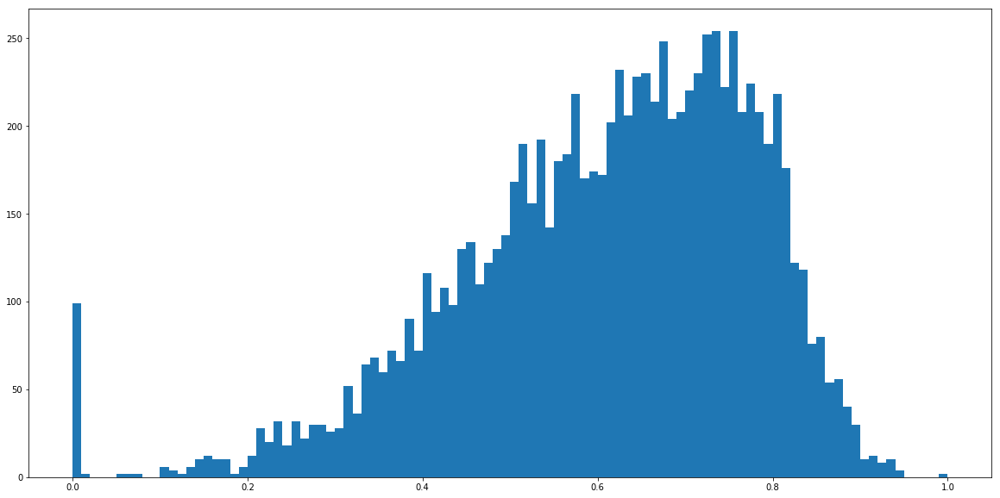

In [0]:
# Analyze distribution of dissimilarity score
print(sim)
d = np.diagonal(sim)
print('diagonal avg=%.2f min=%.2f max=%.2f' % (np.mean(d), np.min(sim), np.max(sim)))
simflat = sim.reshape((-1,))
plt.rcParams["figure.figsize"] = (20,10)
_ = plt.hist(simflat, bins=100)
plt.show()

In [0]:
idfmat = sim.copy()
for idfthr in list(reversed([i/100 for i in range(101)])):
  if(min([max([i for i in j if i < idfthr]) for j in idfmat]) == 0):
    print('The threshold can be set to a value at or above {:.2f}'.format(idfthr))
    break 

The threshold can be set to a value at or above 0.59


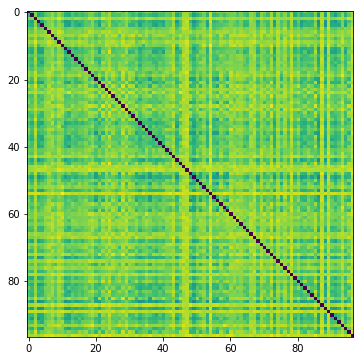

In [0]:
# View an image representation of the distance matrix

plt.figure(figsize=(6,6))
plt.imshow(sim)
plt.show()

In [0]:
# Select a suitable threshold and set dissimilarity scores larger than that threshold to zero

threshold = 0.59
adjmat = sim.reshape((-1,)).copy()
adjmat[adjmat > threshold] = 0
#adjmat[adjmat > 0] = 1
print("{} out of {} values set to zero".format(len(adjmat[adjmat == 0]), len(adjmat)))
adjmat = adjmat.reshape(sim.shape)

3097 out of 9409 values set to zero


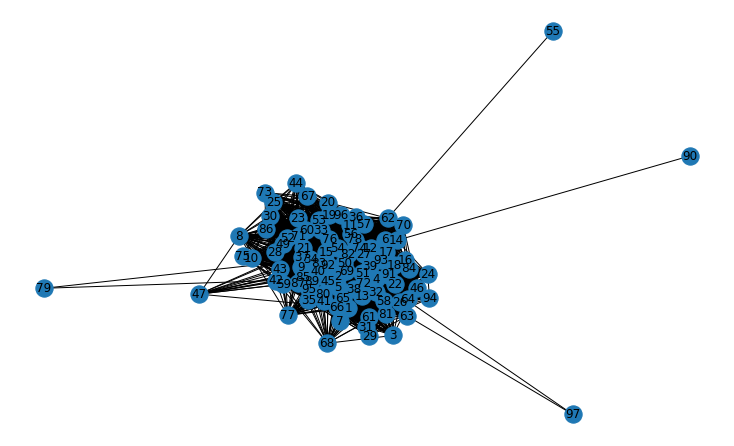

In [0]:
# Construct a networkx graph from the adjacency matrix
# (Singleton nodes are excluded from the graph)


G = make_graph(adjmat, labels=labels)
plt.rcParams["figure.figsize"] = (10, 6)
nx.draw(G, with_labels=True)

##Community detection using Girvan-Newman

[{'53', '90', '67', '66', '92', '49', '8', '59', '43', '15', '29', '91', '89', '11', '60', '64', '57', '62', '73', '79', '61', '75', '39', '82', '97', '87', '18', '44', '6', '83', '71', '86', '78', '45', '2', '80', '19', '55', '93', '24', '63', '16', '65', '52', '20', '26', '77', '95', '5', '56', '10', '41', '70', '47', '27', '13', '17', '22', '54', '85', '58', '9', '25', '96', '12', '46', '72', '1', '30', '7', '94', '23', '34', '69', '37', '31', '3', '42', '38', '21', '50', '32', '14', '4', '84', '68', '40', '51', '81', '36', '33', '35', '76', '28', '74'}]
label_propagation_communities


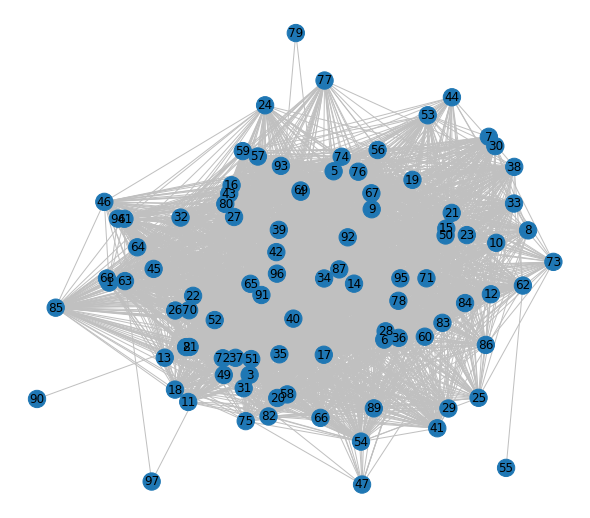

In [0]:
from networkx.algorithms.community import label_propagation_communities
from IPython.display import display
from PIL import Image

comp = list(label_propagation_communities(G))
print(comp)

# color_map = ["" for x in range(len(G))]
# color = 0
# for c in comp:
# #     print(list(c))
#     indices = [i for i, x in enumerate(G.nodes) if x in c]
#     for i in indices:
#         color_map[i] = Config.colors[color]
#     color += 1
# for clr in color_map:
#     if clr == "":
#         color_map[color_map.index(clr)] = Config.colors[color]
#         color += 1
# print("label_propagation_communities")
# nx.draw(G, node_color=color_map, with_labels=True)
# plt.show()

pos = getpos(G, comp)

# Gives colors to the clusters
color_map = []
cls_elem_count = np.array([len(c) for c in comp])
n2c = dict()
for i, c in enumerate(comp):
    for n in c:
        n2c[str(n)] = i
palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
for node in G.nodes:
    c = n2c[node]
    if cls_elem_count[c] == 1:
        idx = 0
    else:
        idx = c % len(palette)
    color_map.append(palette[idx])

print("label_propagation_communities")
plt.figure(figsize=(8, 7))
nx.draw(G, pos=pos, node_color=color_map, edge_color='silver', with_labels=True)
plt.show()

# for nodes in comp:
#       list_im=[]
#       for node in nodes:
#         if(os.path.exists('gdrive/My Drive/colab/images 2/%s.jpg' % ((node)))):
#           list_im.append('gdrive/My Drive/colab/images 2/%s.jpg' % ((node)))

      
#       new_im=Image.new('RGB',(182*len(list_im),268))
#       i=0
#       for elem in list_im:
#           im=Image.open(elem)
#           new_im.paste(im,(i,0))
#           i=i+182
#       display(new_im)

[frozenset({'73', '86', '53', '20', '44', '67', '30', '25', '23'}), frozenset({'24', '94', '26', '31'}), frozenset({'8', '59', '43', '47'}), frozenset({'1', '68', '3'}), frozenset({'81', '46', '29'}), frozenset({'19', '70', '10'}), frozenset({'18', '75', '61'}), frozenset({'4', '63', '97'}), frozenset({'77', '64'}), frozenset({'14', '90'}), frozenset({'42', '79'}), frozenset({'62', '55'}), frozenset({'2'}), frozenset({'5'}), frozenset({'6'}), frozenset({'7'}), frozenset({'9'}), frozenset({'11'}), frozenset({'12'}), frozenset({'13'}), frozenset({'15'}), frozenset({'16'}), frozenset({'17'}), frozenset({'21'}), frozenset({'22'}), frozenset({'27'}), frozenset({'28'}), frozenset({'32'}), frozenset({'33'}), frozenset({'34'}), frozenset({'35'}), frozenset({'36'}), frozenset({'37'}), frozenset({'38'}), frozenset({'39'}), frozenset({'40'}), frozenset({'41'}), frozenset({'45'}), frozenset({'49'}), frozenset({'50'}), frozenset({'51'}), frozenset({'52'}), frozenset({'54'}), frozenset({'56'}), froz

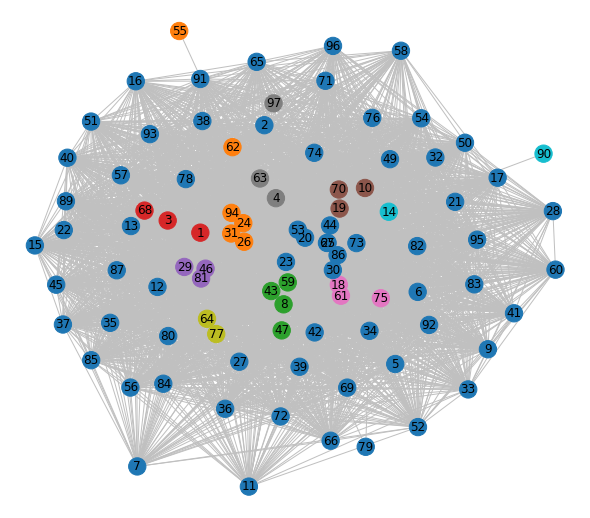

In [0]:
from networkx.algorithms.community import greedy_modularity_communities
from IPython.display import display
from PIL import Image

comp = list(greedy_modularity_communities(G))
print(comp)

# color_map = ["" for x in range(len(G))]
# color = 0
# for c in comp:
# #     print(list(c))
#     indices = [i for i, x in enumerate(G.nodes) if x in c]
#     for i in indices:
#         color_map[i] = Config.colors[color]
#     color += 1
# for clr in color_map:
#     if clr == "":
#         color_map[color_map.index(clr)] = Config.colors[color]
#         color += 1
# print("greedy_modularity_communities")
# nx.draw(G, node_color=color_map, with_labels=True)
# plt.show()

pos = getpos(G, comp)

# Gives colors to the clusters
color_map = []
cls_elem_count = np.array([len(c) for c in comp])
n2c = dict()
for i, c in enumerate(comp):
    for n in c:
        n2c[str(n)] = i
palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
for node in G.nodes:
    c = n2c[node]
    if cls_elem_count[c] == 1:
        idx = 0
    else:
        idx = c % len(palette)
    color_map.append(palette[idx])

print("greedy_modularity_communities")
plt.figure(figsize=(8, 7))
nx.draw(G, pos=pos, node_color=color_map, edge_color='silver', with_labels=True)
plt.show()

# for nodes in comp:
#       list_im=[]
#       for node in nodes:
#         if(os.path.exists('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))):
#           list_im.append('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))

      
#       new_im=Image.new('RGB', (182*len(list_im),268))
#       i=0
#       for elem in list_im:
#           im=Image.open(elem)
#           new_im.paste(im,(i,0))
#           i=i+182
#       display(new_im)

[{'53', '90', '67', '66', '92', '49', '8', '59', '43', '15', '29', '91', '89', '11', '60', '64', '57', '62', '73', '79', '61', '75', '39', '82', '97', '87', '18', '44', '6', '83', '71', '86', '78', '45', '2', '80', '19', '55', '93', '24', '63', '16', '65', '52', '20', '26', '77', '95', '5', '56', '10', '41', '70', '47', '27', '13', '17', '22', '54', '85', '58', '9', '25', '96', '12', '46', '72', '1', '30', '7', '94', '23', '34', '69', '37', '31', '3', '42', '38', '21', '50', '32', '14', '4', '84', '68', '40', '51', '81', '36', '33', '35', '76', '28', '74'}]
asyn_lpa_communities


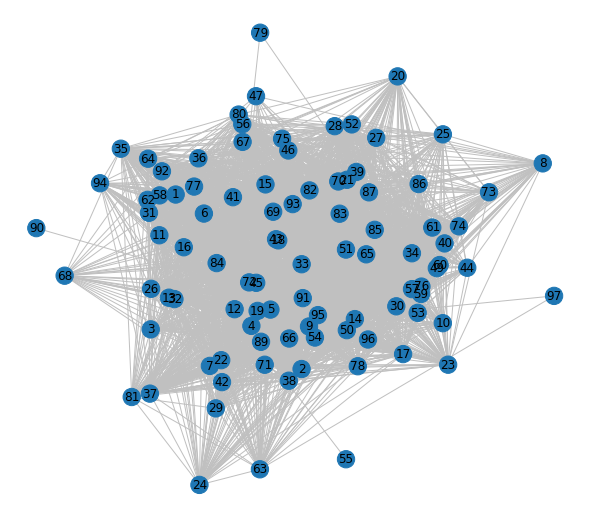

In [0]:
from networkx.algorithms.community import asyn_lpa_communities
from IPython.display import display
from PIL import Image

comp = list(asyn_lpa_communities(G))
print(comp)

# color_map = ["" for x in range(len(G))]
# color = 0
# for c in comp:
# #     print(list(c))
#     indices = [i for i, x in enumerate(G.nodes) if x in c]
#     for i in indices:
#         color_map[i] = Config.colors[color]
#     color += 1
# for clr in color_map:
#     if clr == "":
#         color_map[color_map.index(clr)] = Config.colors[color]
#         color += 1
# print("asyn_lpa_communities")
# nx.draw(G, node_color=color_map, with_labels=True)
# plt.show()

pos = getpos(G, comp)

# Gives colors to the clusters
color_map = []
cls_elem_count = np.array([len(c) for c in comp])
n2c = dict()
for i, c in enumerate(comp):
    for n in c:
        n2c[str(n)] = i
palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
for node in G.nodes:
    c = n2c[node]
    if cls_elem_count[c] == 1:
        idx = 0
    else:
        idx = c % len(palette)
    color_map.append(palette[idx])

print("asyn_lpa_communities")
plt.figure(figsize=(8, 7))
nx.draw(G, pos=pos, node_color=color_map, edge_color='silver', with_labels=True)
plt.show()

# for nodes in comp:
#       list_im=[]
#       for node in nodes:
#         if(os.path.exists('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))):
#           list_im.append('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))

      
#       new_im=Image.new('RGB',(182*len(list_im),268))
#       i=0
#       for elem in list_im:
#           im=Image.open(elem)
#           new_im.paste(im,(i,0))
#           i=i+182
#       display(new_im)

1
k_clique_communities


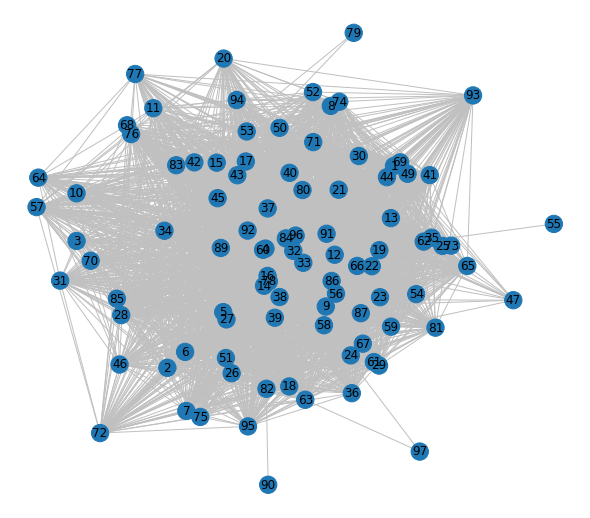

In [0]:
from networkx.algorithms.community import k_clique_communities
from IPython.display import display
from PIL import Image

comp = list(k_clique_communities(G, 2))
print(len(comp))

# color_map = ["" for x in range(len(G))]
# color = 0
# for c in comp:
# #     print(list(c))
#     indices = [i for i, x in enumerate(G.nodes) if x in c]
#     for i in indices:
#         color_map[i] = Config.colors[color]
#     color += 1
# for clr in color_map:
#     if clr == "":
#         color_map[color_map.index(clr)] = Config.colors[color]
#         color += 1
# print("k_clique_communities")
# nx.draw(G, node_color=color_map, with_labels=True)
# plt.show()

pos = getpos(G, comp)

# Gives colors to the clusters
color_map = []
cls_elem_count = np.array([len(c) for c in comp])
n2c = dict()
for i, c in enumerate(comp):
    for n in c:
        n2c[str(n)] = i
palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
for node in G.nodes:
    c = n2c[node]
    if cls_elem_count[c] == 1:
        idx = 0
    else:
        idx = c % len(palette)
    color_map.append(palette[idx])

print("k_clique_communities")
plt.figure(figsize=(8, 7))
nx.draw(G, pos=pos, node_color=color_map, edge_color='silver', with_labels=True)
plt.show()

# for nodes in comp:
#       list_im=[]
#       for node in nodes:
#         if(os.path.exists('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))):
#           list_im.append('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))

      
#       new_im=Image.new('RGB',(182*len(list_im),268))
#       i=0
#       for elem in list_im:
#           im=Image.open(elem)
#           new_im.paste(im,(i,0))
#           i=i+182
#       display(new_im)

<generator object girvan_newman at 0x7faeb5c11048>
Possible clusters 1 : ({'53', '67', '66', '92', '49', '8', '59', '43', '15', '29', '91', '89', '11', '60', '64', '57', '62', '73', '79', '61', '75', '39', '82', '97', '87', '18', '44', '6', '83', '71', '86', '78', '45', '2', '80', '19', '55', '93', '24', '63', '16', '65', '52', '20', '26', '77', '95', '5', '56', '10', '41', '70', '47', '27', '13', '17', '22', '54', '85', '58', '9', '25', '96', '12', '46', '72', '1', '30', '7', '94', '23', '34', '69', '37', '31', '3', '42', '38', '21', '50', '32', '14', '4', '84', '68', '40', '51', '81', '36', '33', '35', '76', '28', '74'}, {'90'})


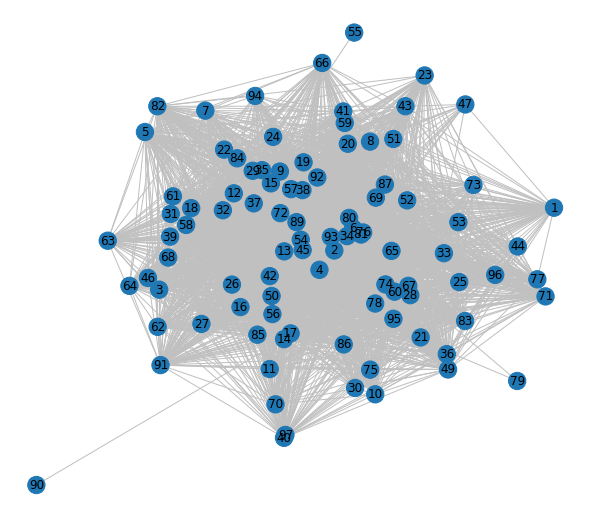

Possible clusters 2 : ({'53', '67', '66', '92', '49', '8', '59', '43', '15', '29', '91', '89', '11', '60', '64', '57', '62', '73', '79', '61', '75', '39', '82', '97', '87', '18', '44', '6', '83', '71', '86', '78', '45', '2', '80', '19', '93', '24', '63', '16', '65', '52', '20', '26', '77', '95', '5', '56', '10', '41', '70', '47', '27', '13', '17', '22', '54', '85', '58', '9', '25', '96', '12', '46', '72', '1', '30', '7', '94', '23', '34', '69', '37', '31', '3', '42', '38', '21', '50', '32', '14', '4', '84', '68', '40', '51', '81', '36', '33', '35', '76', '28', '74'}, {'90'}, {'55'})


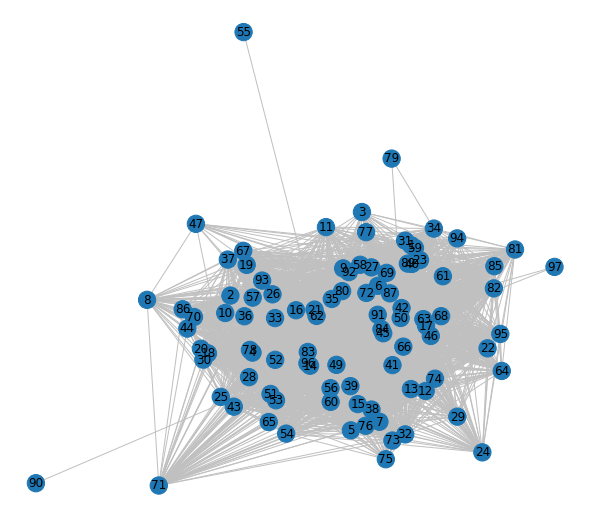

Possible clusters 3 : ({'53', '67', '66', '92', '49', '8', '59', '43', '15', '29', '91', '89', '11', '60', '64', '57', '62', '73', '79', '61', '75', '39', '82', '87', '18', '44', '6', '83', '71', '86', '78', '45', '2', '80', '19', '93', '24', '63', '16', '65', '52', '20', '26', '77', '95', '5', '56', '10', '41', '70', '47', '27', '13', '17', '22', '54', '85', '58', '9', '25', '96', '12', '46', '72', '1', '30', '7', '94', '23', '34', '69', '37', '31', '3', '42', '38', '21', '50', '32', '14', '4', '84', '68', '40', '51', '81', '36', '33', '35', '76', '28', '74'}, {'97'}, {'90'}, {'55'})


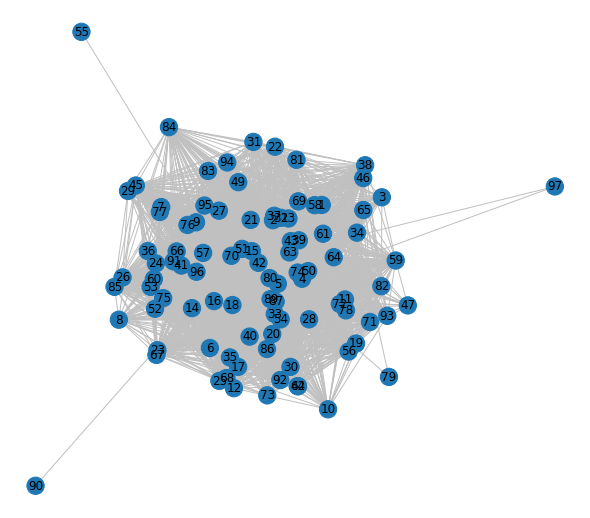

In [0]:
from networkx.algorithms.community.centrality import girvan_newman
from networkx.algorithms.community import LFR_benchmark_graph
from networkx.algorithms.community import k_clique_communities
from networkx.algorithms.community import asyn_lpa_communities
from networkx.algorithms.community import label_propagation_communities
from IPython.display import display
from PIL import Image

comp = girvan_newman(G)
# comp = list(k_clique_communities(G, 2))
# comp = asyn_lpa_communities(G)
# comp = label_propagation_communities(G)
print(comp)

max_shown = 3
shown_count = 1
possibilities = []
for communities in itertools.islice(comp, max_shown):
    print("Possible clusters", shown_count, ": ", end='')
    print(communities)
    pos = getpos(G, communities)

    # Gives colors to the clusters
    color_map = []
    cls_elem_count = np.array([len(c) for c in communities])
    n2c = dict()
    for i, c in enumerate(communities):
        for n in c:
            n2c[str(n)] = i
    palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
    for node in G.nodes:
        c = n2c[node]
        if cls_elem_count[c] == 1:
            idx = 0
        else:
            idx = c % len(palette)
        color_map.append(palette[idx])

    shown_count += 1

    plt.figure(figsize=(8, 7))
    nx.draw(G, pos=pos, node_color=color_map, edge_color='silver', with_labels=True)
    plt.show()
    
# for nodes in comp:
#       list_im=[]
#       for node in nodes:
#         if(os.path.exists('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))):
#           list_im.append('gdrive/My Drive/colab/meta/%s.jpg' % ((node)))

      
#       new_im=Image.new('RGB',(200*len(list_im),300))
#       i=0
#       for elem in list_im:
#           im=Image.open(elem)
#           new_im.paste(im,(i,0))
#           i=i+182
#       display(new_im)


99 out of 9409 values set to zero
threshold = 0.700000


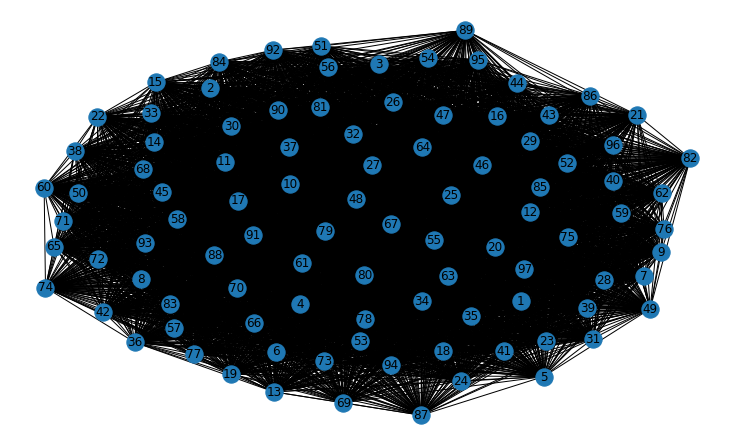

In [0]:
for threshold in [ i/100 for i in range(70, 200, 5)]:
#   threshold = 0.7
  adjmat = sim.reshape((-1,)).copy()
  adjmat[adjmat > threshold] = 0
  #adjmat[adjmat > 0] = 1
  print("{} out of {} values set to zero".format(len(adjmat[adjmat == 0]), len(adjmat)))
  adjmat = adjmat.reshape(sim.shape)

  G = make_graph(adjmat, labels=labels)
  if(nx.is_connected(G)):
    print("threshold = %f" % threshold)
    break
    
plt.rcParams["figure.figsize"] = (10, 6)
nx.draw(G, with_labels=True)

[{'52', '1', '81', '36', '49', '35', '10', '58', '38', '83', '87', '18', '96', '50', '23'}, {'34', '46', '37', '31', '78', '2', '13', '66', '89', '22', '59', '64', '71', '94', '95', '12', '32'}, {'20', '51', '53', '4', '27', '44', '75', '17', '45', '80', '30', '60', '93', '70'}, {'62', '79', '24', '73', '57', '26', '56', '41', '9', '77', '6', '82', '97', '21', '43', '88', '15', '40', '29', '16'}, {'5', '85', '90', '76', '84', '67', '28', '42', '55', '48', '74', '63', '54', '47'}, {'92', '69', '65', '72', '61', '91', '14', '86', '3', '39', '8', '19', '7', '11', '68', '33', '25'}]
asyn_fluidc


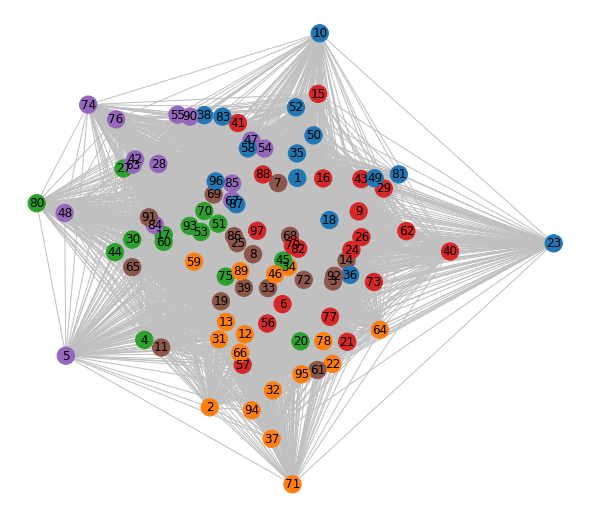

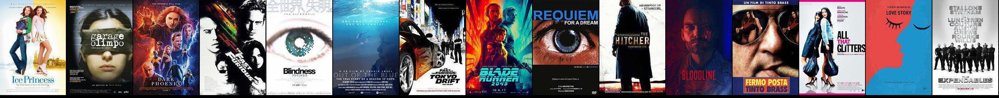

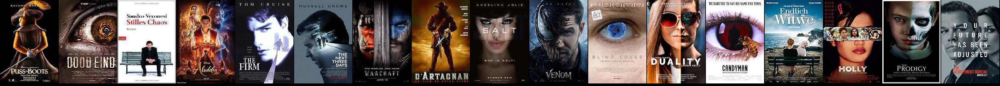

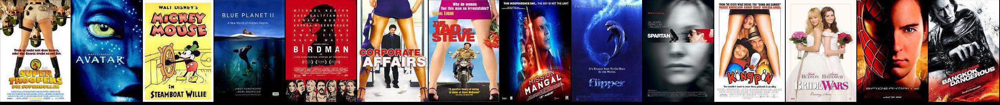

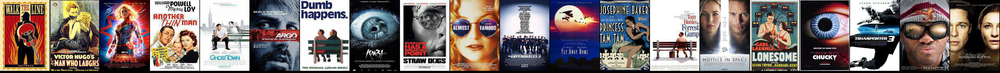

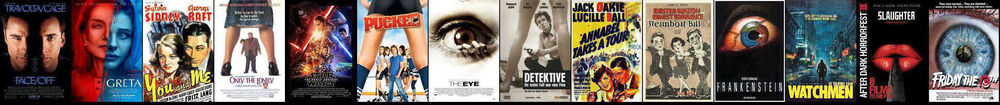

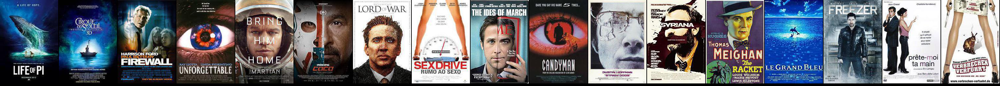

In [0]:
from networkx.algorithms.community import asyn_fluidc
from IPython.display import display
from PIL import Image

comp = list(asyn_fluidc(G, 6))
print(comp)

# color_map = ["" for x in range(len(G))]
# color = 0
# for c in comp:
#     print(list(c))
#     indices = [i for i, x in enumerate(G.nodes) if x in c]
#     for i in indices:
#         color_map[i] = Config.colors[color]
#     color += 1
# for clr in color_map:
#     if clr == "":
#         color_map[color_map.index(clr)] = Config.colors[color]
#         color += 1
# print(color_map)
# nx.draw(G, node_color=color_map, with_labels=True)
# plt.show()
pos = getpos(G, comp)

# Gives colors to the clusters
color_map = []
cls_elem_count = np.array([len(c) for c in comp])
n2c = dict()
for i, c in enumerate(comp):
    for n in c:
        n2c[str(n)] = i
palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
for node in G.nodes:
    c = n2c[node]
    if cls_elem_count[c] == 1:
        idx = 0
    else:
        idx = c % len(palette)
    color_map.append(palette[idx])

shown_count += 1

print("asyn_fluidc")
plt.figure(figsize=(8, 7))
nx.draw(G, pos=pos, node_color=color_map, edge_color='silver', with_labels=True)
plt.show()

for nodes in comp:
      list_im=[]
      for node in nodes:
        if(os.path.exists('gdrive/My Drive/colab/images 2/%s.jpg' % ((node)))):
          list_im.append('gdrive/My Drive/colab/images 2/%s.jpg' % ((node)))

      
      new_im=Image.new('RGB',(182*len(list_im),268))
      i=0
      for elem in list_im:
          im=Image.open(elem)
          new_im.paste(im,(i,0))
          i=i+182
      display(new_im)

Possibility 1 : ({'11', '26', '17', '94', '46', '97', '16', '82', '69', '3', '96', '45', '56', '52', '6', '65', '53', '30', '15', '77', '2', '51', '92', '68', '22', '86', '38', '29', '39', '10', '89', '44', '35', '91', '80', '79', '85', '42', '76', '43', '70', '83', '27', '36', '58', '32', '66', '7', '28', '34', '21', '20', '74', '54', '64', '73', '75', '50', '61', '84', '67', '62', '31', '19', '72', '78', '47', '41', '25', '18', '12', '23', '81', '8', '13', '59', '87', '93', '24', '55', '37', '49', '33', '63', '71', '57', '9', '14', '1', '95', '40', '60', '4', '5'}, {'90'})


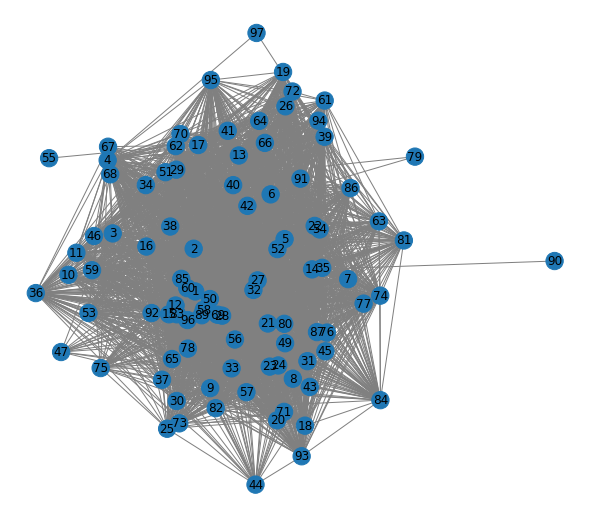

Possibility 2 : ({'11', '26', '17', '94', '46', '97', '16', '82', '69', '3', '96', '45', '56', '52', '6', '65', '53', '30', '15', '77', '2', '51', '92', '68', '22', '86', '38', '29', '39', '10', '89', '44', '35', '91', '80', '79', '85', '42', '76', '43', '70', '83', '27', '36', '58', '32', '66', '7', '28', '34', '21', '20', '74', '54', '64', '73', '75', '50', '61', '84', '67', '62', '31', '19', '72', '78', '47', '41', '25', '18', '12', '23', '81', '8', '13', '59', '87', '93', '24', '37', '49', '33', '63', '71', '57', '9', '14', '1', '95', '40', '60', '4', '5'}, {'90'}, {'55'})


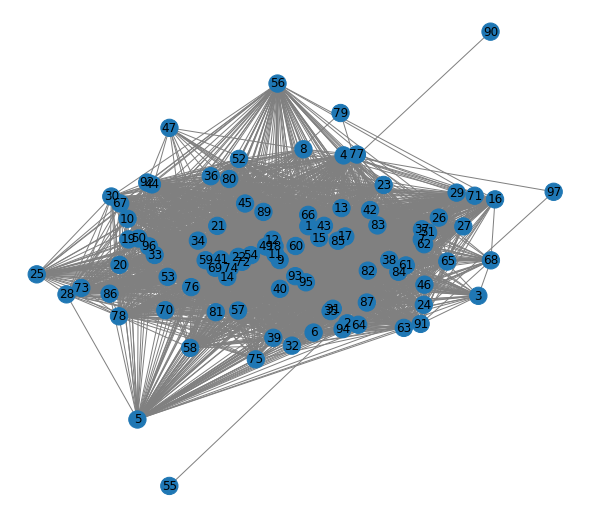

Possibility 3 : ({'11', '26', '17', '94', '46', '16', '82', '69', '3', '96', '45', '56', '52', '6', '65', '53', '30', '15', '77', '2', '51', '92', '68', '22', '86', '38', '29', '39', '10', '89', '44', '35', '91', '80', '79', '85', '42', '76', '43', '70', '83', '27', '36', '58', '32', '66', '7', '28', '34', '21', '20', '74', '54', '64', '73', '75', '50', '61', '84', '67', '62', '31', '19', '72', '78', '47', '41', '25', '18', '12', '23', '81', '8', '13', '59', '87', '93', '24', '37', '49', '33', '63', '71', '57', '9', '14', '1', '95', '40', '60', '4', '5'}, {'97'}, {'90'}, {'55'})


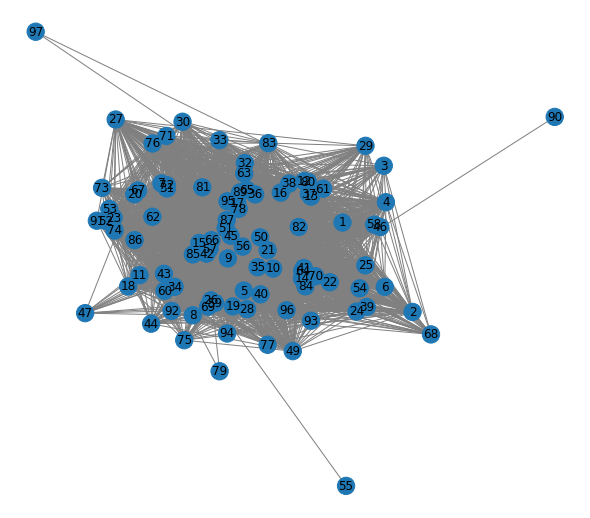

In [0]:
from networkx.algorithms.community.centrality import girvan_newman

comp = girvan_newman(G)

max_shown = 3
shown_count = 1
for communities in itertools.islice(comp, max_shown):
    print("Possibility", shown_count, ": ", end='')
    print(communities)
    
    # Find nodes layout using pals
    pos = getpos(G, communities)
    
    # Gives colors to the clusters
    color_map = []
    cls_elem_count = np.array([len(c) for c in communities])
    n2c = dict()
    for i, c in enumerate(communities):
        for n in c:
            n2c[str(n)] = i
    palette = sns.color_palette(None, len(cls_elem_count[cls_elem_count > 1]))
    for node in G.nodes:
        c = n2c[node]
        if cls_elem_count[c] == 1:
            idx = 0
        else:
            idx = c % len(palette)
        color_map.append(palette[idx])

    shown_count += 1

    plt.figure(figsize=(8, 7))
    nx.draw(G, pos=pos, node_color=color_map, edge_color='grey', with_labels=True)
    plt.show()

##Visualization

###Gephi
Gephi Download - https://gephi.org/users/download/<br>
Gephi HOWTO    - https://gephi.wordpress.com/2017/09/26/gephi-0-9-2-a-new-csv-importer/<br>
*(It is possible to colorize communities in Gephi - read here: https://github.com/kalngyk/repoman/raw/master/gephi_communities.pdf)*


In [0]:
# Generate edges for Gephi

export_edge_list(adjmat, labels=labels, filename='gephi-edges.csv')

###pals
pals HOWTO - https://github.com/kalngyk/repoman/raw/master/usepals.pdf


In [0]:
# Generate edges for pals system

export_edge_list(adjmat, labels=labels, filename='pals-edges.txt', delim=" ", header=False)

In [0]:
# Generate community file for pals system

which_possibility = 3

communities = possibilities[which_possibility-1]

f = open(savedir + 'pals-community.txt', 'w')
cur_com = 1
for c in communities:
    indices = [i for i, x in enumerate(G.nodes) if x in c]
    for i in indices:
        if labels == None:
            f.write(str(i) + " " + str(cur_com) + "\n")
        else:
            f.write("\"" + labels[i] + "\" " + str(cur_com) + "\n")
    cur_com += 1
f.close()

os.listdir(savedir)